# importing packages

In [ ]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings 
from sklearn.svm import SVC, NuSVC
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.neighbors  import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb
from scipy import stats
from scipy.stats import uniform, randint
from sklearn.metrics import f1_score
from sklearn.model_selection import KFold, StratifiedKFold, RepeatedStratifiedKFold
from sklearn.metrics import roc_curve, auc, accuracy_score
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report
from scipy import interp
from sklearn.metrics import confusion_matrix
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA
from keras.utils import to_categorical
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import roc_auc_score, accuracy_score

# loading data

In [ ]:
data=pd.read_csv("Dia.csv")

In [ ]:
data.head(n=6)

,PatientID,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,Unnamed: 4,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
0,1354778,0,171,80,NaN,34,23,43.509726,1.213191,21,0
1,1147438,8,92,93,NaN,47,36,21.240576,0.158365,23,0
2,1640031,7,115,47,NaN,52,35,41.511523,0.079019,23,0
3,1883350,9,103,78,NaN,25,304,29.582192,1.282870,43,1
4,1424119,1,85,59,NaN,27,35,42.604536,0.549542,22,0
5,1619297,0,82,92,NaN,9,253,19.724160,0.103424,26,0


In [ ]:
data = data.drop('Unnamed: 4', axis=1)
data = data.drop('PatientID', axis=1)
data

,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
0,0,171,80,34,23,43.509726,1.213191,21,0
1,8,92,93,47,36,21.240576,0.158365,23,0
2,7,115,47,52,35,41.511523,0.079019,23,0
3,9,103,78,25,304,29.582192,1.282870,43,1
4,1,85,59,27,35,42.604536,0.549542,22,0
...,...,...,...,...,...,...,...,...,...
14890,10,65,60,46,177,33.512468,0.148327,41,1
14891,2,73,66,27,168,30.132636,0.862252,38,1
14892,0,93,89,43,57,18.690683,0.427049,24,0
14893,0,132,98,18,161,19.791645,0.302257,23,0


In [ ]:
data = pd.DataFrame({'F1':data.iloc[:,:8].values[:,0],
                     'F2':data.iloc[:,:8].values[:,1],
                     'F3':data.iloc[:,:8].values[:,2],
                     'F4':data.iloc[:,:8].values[:,3],
                     'F5':data.iloc[:,:8].values[:,4],
                     'F6':data.iloc[:,:8].values[:,5],
                     'F7':data.iloc[:,:8].values[:,6],
                     'F8':data.iloc[:,:8].values[:,7],
                     'Outcome':data.iloc[:,8:].values[:,0]})
data

,F1,F2,F3,F4,F5,F6,F7,F8,Outcome
0,0.0,171.0,80.0,34.0,23.0,43.509726,1.213191,21.0,0
1,8.0,92.0,93.0,47.0,36.0,21.240576,0.158365,23.0,0
2,7.0,115.0,47.0,52.0,35.0,41.511523,0.079019,23.0,0
3,9.0,103.0,78.0,25.0,304.0,29.582192,1.282870,43.0,1
4,1.0,85.0,59.0,27.0,35.0,42.604536,0.549542,22.0,0
...,...,...,...,...,...,...,...,...,...
14890,10.0,65.0,60.0,46.0,177.0,33.512468,0.148327,41.0,1
14891,2.0,73.0,66.0,27.0,168.0,30.132636,0.862252,38.0,1
14892,0.0,93.0,89.0,43.0,57.0,18.690683,0.427049,24.0,0
14893,0.0,132.0,98.0,18.0,161.0,19.791645,0.302257,23.0,0


In [ ]:
data.describe()

,F1,F2,F3,F4,F5,F6,F7,F8,Outcome
count,14895.000000,14895.000000,14895.000000,14895.000000,14895.000000,14895.000000,14895.000000,14895.000000,14895.000000
mean,3.224841,107.868278,71.238469,28.804162,137.957637,31.514957,0.398842,30.138234,0.333199
std,3.391987,32.002972,16.754499,14.555187,133.120086,9.759037,0.378169,12.089241,0.471373
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200512,0.078044,21.000000,0.000000
25%,0.000000,84.000000,58.000000,15.000000,39.000000,21.259603,0.137695,22.000000,0.000000
50%,2.000000,104.000000,72.000000,30.000000,83.000000,31.772471,0.200038,24.000000,0.000000
75%,6.000000,129.000000,85.000000,41.000000,195.000000,39.254649,0.615603,35.000000,1.000000
max,14.000000,192.000000,117.000000,93.000000,799.000000,56.034628,2.301594,77.000000,1.000000


In [ ]:
Renamed_feature= []               
all_clf_res=[]                    
random_initializer=20           
n_dots=50

for i in range(8): 
  Renamed_feature.append('F'+str(i+1)) 


def pair_plot(data):
  plt.figure()
  
  pair_plot =sns.pairplot(data=data,            
                          height=3,
                          hue='Outcome',  
                          diag_kind='kde')
  pair_plot.fig.suptitle("Pairplot of all features")
  plt.show()

def Box_Gaussian(data):

  fig=plt.figure(figsize=(15,6))                                
  fig.suptitle("Box Gaussian plot of all features")
  
  n_scaler = preprocessing.StandardScaler()                
  temp_Data = n_scaler.fit_transform(data)                  
  for i in range(8):                                        
    
    plt.subplot(2, 4, i+1)                                  
    Data = temp_Data[:,i]                                   
    sns.kdeplot(Data, shade=True,color='red', alpha=0.3)    
    ax = sns.boxplot(Data, saturation=0.9, color="green")   
    plt.gca().invert_yaxis()                                
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticklabels([])                    
    plt.ylim((-0.5,0.65))                                   
    plt.tight_layout()                                      
    
    for patch in ax.artists:
      r, g, b, a = patch.get_facecolor()                     
      patch.set_facecolor((r, g, b, 0.3))                   


def plot_confusionMatrix(data):
  sns.set(font_scale=1.15)                                   
  ax = plt.figure(figsize=(10, 8))                            
  plt.title("Confusion Matrix of all features")
  sns.heatmap(data.corr(),                                    
              vmax=1.0,                                       
                                                              
              vmin=0.0,
              linewidths=0.01,
              square=False,                                   
              annot=True,                                      
              linecolor="black")                                      
                                                              
  b, t = plt.ylim()                                           
  b += 0.5                                                    
  t -= 0.5                                                   
  plt.ylim(b, t)                                             

def dist_Plot(data):
 
  fig, ax = plt.subplots(2,4, figsize=(12,5))                 
  sns.distplot(data.F1, bins = 10, ax=ax[0,0])                
  sns.distplot(data.F2, bins = 10, ax=ax[0,1]) 
  sns.distplot(data.F3, bins = 10, ax=ax[0,2]) 
  sns.distplot(data.F4, bins = 10, ax=ax[0,3])
  sns.distplot(data.F5, bins = 10, ax=ax[1,0]) 
  sns.distplot(data.F6, bins = 10, ax=ax[1,1]) 
  sns.distplot(data.F7, bins = 10, ax=ax[1,2]) 
  sns.distplot(data.F8, bins = 10, ax=ax[1,3]) 
  fig.suptitle("Gaussian Distribution of all features")
  fig.tight_layout()                                          

def plot_violinplot (data):

  fig, ax = plt.subplots(2,4, figsize=(12,6))          
  sns.set()
  sns.violinplot(x = data.Outcome, y=data.F1,  ax=ax[0,0])    
  sns.violinplot(x = data.Outcome, y=data.F2,  ax=ax[0,1])     
  sns.violinplot(x = data.Outcome, y=data.F3,  ax=ax[0,2])    
  sns.violinplot(x = data.Outcome, y=data.F4,  ax=ax[0,3])   
  sns.violinplot(x = data.Outcome, y=data.F5,  ax=ax[1,0])     
  sns.violinplot(x = data.Outcome, y=data.F6,  ax=ax[1,1])    
  sns.violinplot(x = data.Outcome, y=data.F7,  ax=ax[1,2])    
  sns.violinplot(x = data.Outcome, y=data.F8,  ax=ax[1,3])    
  fig.suptitle("Violin plot of all features")
  fig.tight_layout()



def data_plot (data,
               Pair_plot,
               Dist_Plot,
               Plot_violinplot,
               Plot_confusionMatrix,
               box_Gaussian):
  
  if Pair_plot ==True:
    pair_plot(data)

  if Dist_Plot ==True:
    dist_Plot(data)

  if Plot_violinplot ==True:
    plot_violinplot (data)

  if Plot_confusionMatrix ==True:
    plot_confusionMatrix(data)

  if box_Gaussian ==True:
    Box_Gaussian(data)

    

<Figure size 640x480 with 0 Axes>

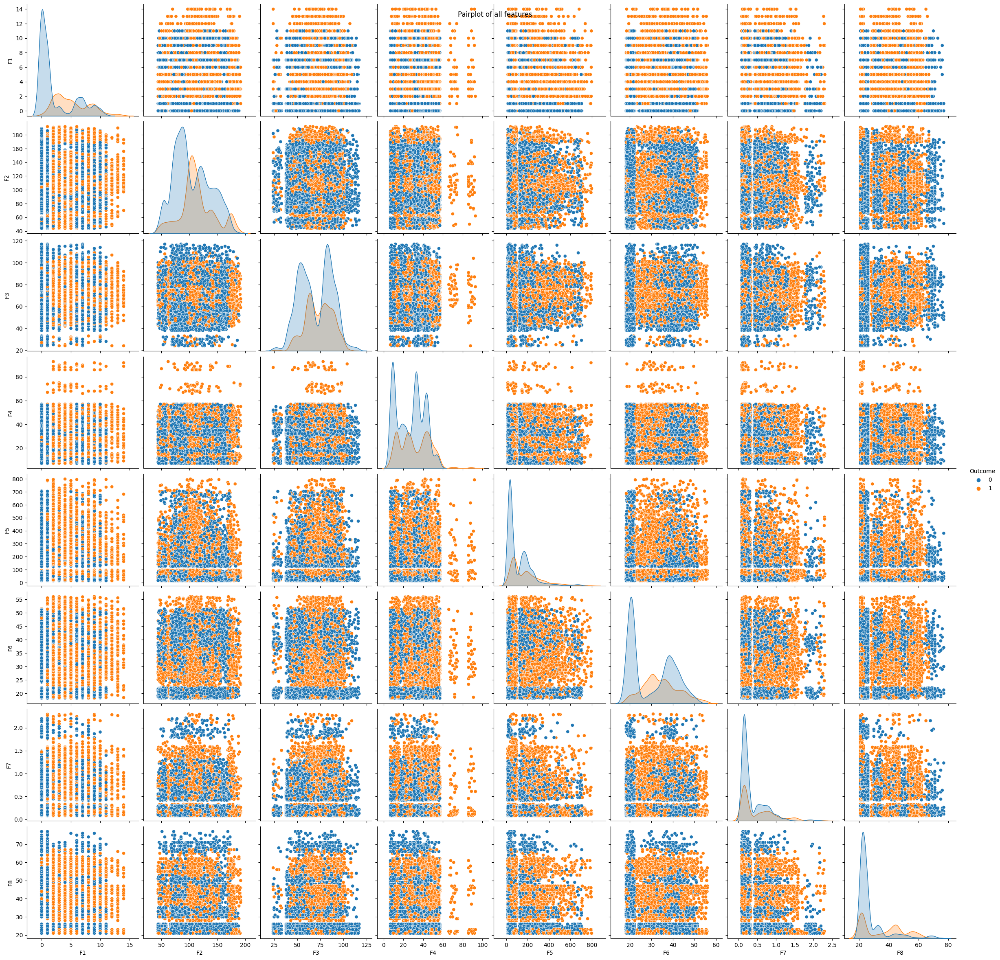

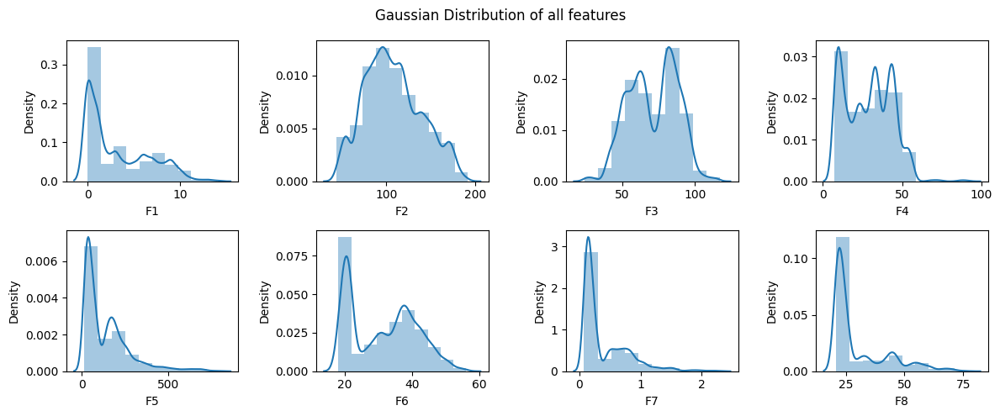

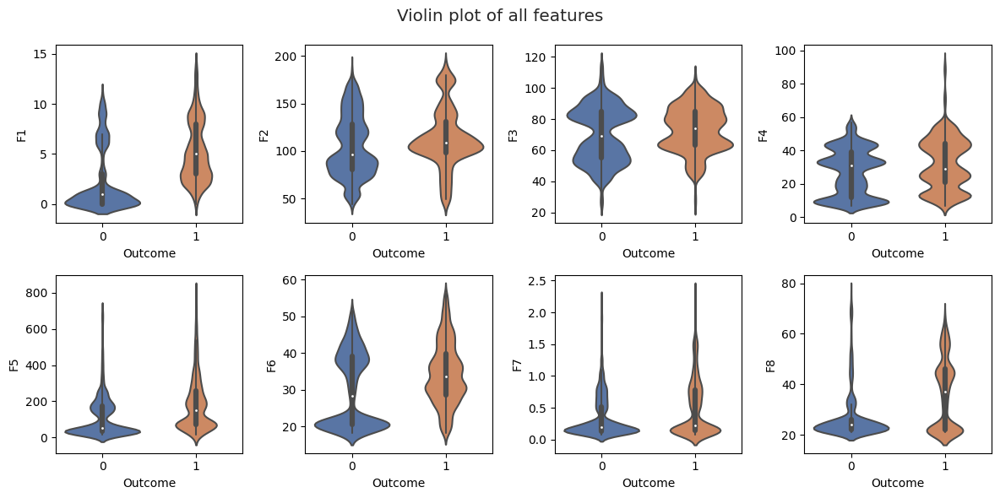

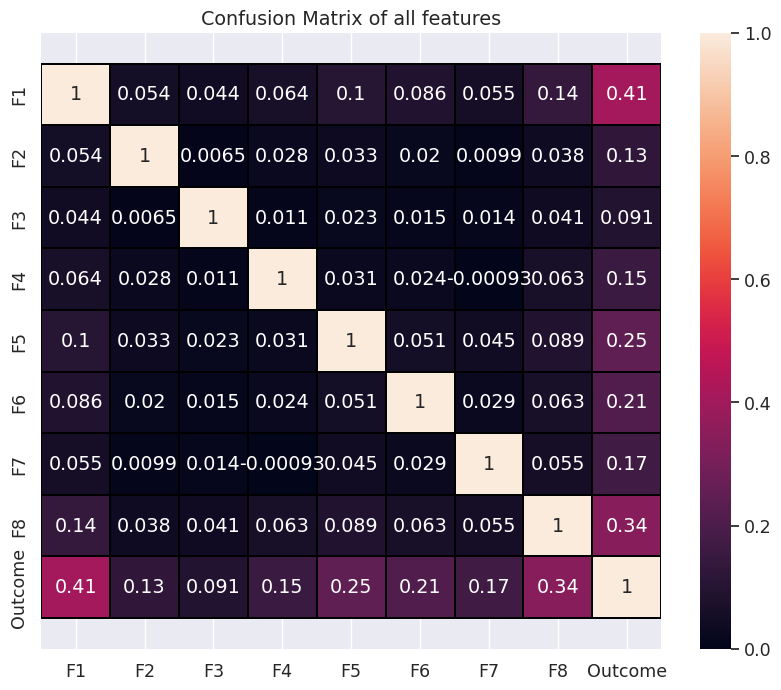

In [ ]:
data_plot (data,
          Pair_plot=True,
          Dist_Plot=True,
          Plot_violinplot=True,
          Plot_confusionMatrix=True,
          box_Gaussian=False)

In [ ]:
def Manual (data):

    max_Pregnancies = data.F1.max()                         
    data = data[data.F1!=max_Pregnancies]                   
    max_Glucose = data.F2.max()                            
    data = data[data.F2!=max_Glucose]                       
    for i in range(4):                                      
      min_Glucose = data.F2.min()                           
      data = data[data.F2!=min_Glucose]                    
    max_BloodPressure = data.F3.max()                       
    data = data[data.F3!=max_BloodPressure]                 
    for i in range(2):                                     
      max_skinthickness = data.F4.max() 
      data = data[data.F4!=max_skinthickness]
    for i in range(25):                                    
      data = data[data.F5!=max_Insulin]
    max_bmi = data.F6.max()
    data = data[data.F6!=max_bmi]
    for i in range(4):                                       
      min_bmi = data.F6.min() 
      data = data[data.F6!=min_bmi]
    for i in range(20):                                      
      max_DiabetesPedigreeF = data.F7.max()
      data = data[data.F7!=max_DiabetesPedigreeF]
    for i in range(20):                                    
      max_age = data.F8.max() 
      data = data[data.F8!=max_age]
      df =data
    return data

def IQR_Mean (data):

  for i in range(8): 
    x = data[Renamed_feature[i]]
    Q1 = x.quantile(0.25)                                   
    Q3 = x.quantile(0.75)                                   
    IQR = Q3-Q1                                             
    mean = x.mean()                                         
    for j in range(569):                                    
      temp = x[j]                                           
      LW = (Q1 - 1.5 * IQR)                                 
      UW = (Q3 + 1.5 * IQR)                                
      if temp < LW:                                        
        x[j] = mean
      if temp > UW:                                        
        x[j] = mean
    data[Renamed_feature[i]] = x
  return data

def IQR_Median (data): 
 
  for i in range(8):
    x = data[Renamed_feature[i]]
    Q1 = x.quantile(0.25)
    Q3 = x.quantile(0.75)
    IQR = Q3-Q1
    median = x.quantile(0.5)                                
    for j in range(569):                                    
      temp = x[j]
      LW = (Q1 - 1.5 * IQR)
      UW = (Q3 + 1.5 * IQR)
      if temp < LW:                                         
        x[j] = median
      if temp > UW:
        x[j] = median                                       
    data[Renamed_feature[i]] = x
  return data

def IQR (data):

  for i in range(8):                                        
    Q1 = data[Renamed_feature[i]].quantile(0.25)
    Q3 = data[Renamed_feature[i]].quantile(0.75)
    IQR = Q3-Q1                                             
    LW = (Q1 - 1.5 * IQR)                                   
    UW = (Q3 + 1.5 * IQR)                                  
    data = data[data[Renamed_feature[i]]<UW]                
    data = data[data[Renamed_feature[i]]>LW]                

  return data


def outlier_Rejection (data, iqr_Mean, iqr_Medain, iqr, manual):
  if iqr_Mean == True:                                     
    data = IQR_Mean (data)
  if iqr_Medain == True:                                   
    data = IQR_Medain (data)
  if iqr == True:                                          
    data = IQR (data)
  if manual == True:                                      
    data = Manual (data)

  return data
def replace_zero(data, field, target):
    
    mean_by_target = data.loc[data[field] != 0, [field, target]].groupby(target).mean()
    data.loc[(data[field] == 0)&(data[target] == 0), field] = mean_by_target.iloc[0][0]
    data.loc[(data[field] == 0)&(data[target] == 1), field] = mean_by_target.iloc[1][0]


In [ ]:
print('Shape Before Process: ' + str(data.shape))

data = outlier_Rejection (data,
                  iqr_Mean=False,
                  iqr_Medain=False,
                  iqr=True,
                  manual=False)
print('Shape After outlier Removed: ' + str(data.shape))

for col in ['F2', 'F3', 'F4', 'F5', 'F6']:   
    replace_zero(data, col, 'Outcome')              
print('Shape After Filling Missing Value: ' + str(data.shape))
     

Shape Before Process: (14895, 9)
Shape After outlier Removed: (12562, 9)
Shape After Filling Missing Value: (12562, 9)


# feature selection

In [ ]:
def feature_Selector(data, algo, n_feature):
    if algo=='PCA':                                                   
        X_Data= data.iloc[:,:8].values
        pca = PCA(n_components=n_feature)                             
        X_Data = pca.fit_transform(X_Data)
        return X_Data , data.iloc[:,8:].values

    if algo == 'ICA':
        X_Data= data.iloc[:,:8].values
        ICA = FastICA(n_components=n_feature, random_state=12) 
        X_Data = ICA.fit_transform(X_Data)
        return X_Data , data.iloc[:,8:].values
    
    if algo =='corr':                                                   
        if n_feature ==4:
            data = data[['F2','F5','F4','F6','Outcome']]               
            return data.iloc[:,:4].values, data.iloc[:,4:].values
        if n_feature ==6:
            data = data[['F1','F2','F4','F5','F6','F8','Outcome']]       
            return data.iloc[:,:6].values, data.iloc[:,6:].values
        
    if algo == 'None':
        return data.iloc[:,:8].values, data.iloc[:,8:].values

In [ ]:
X_Data,Y_Lavel = feature_Selector(data, algo='corr', n_feature=6)    
print('Shape After Feature Selection: ' + str(X_Data.shape))        

kf = StratifiedKFold(n_splits=5,
                     shuffle=True,
                     random_state=random_initializer)

Shape After Feature Selection: (12562, 6)


<Figure size 640x480 with 0 Axes>

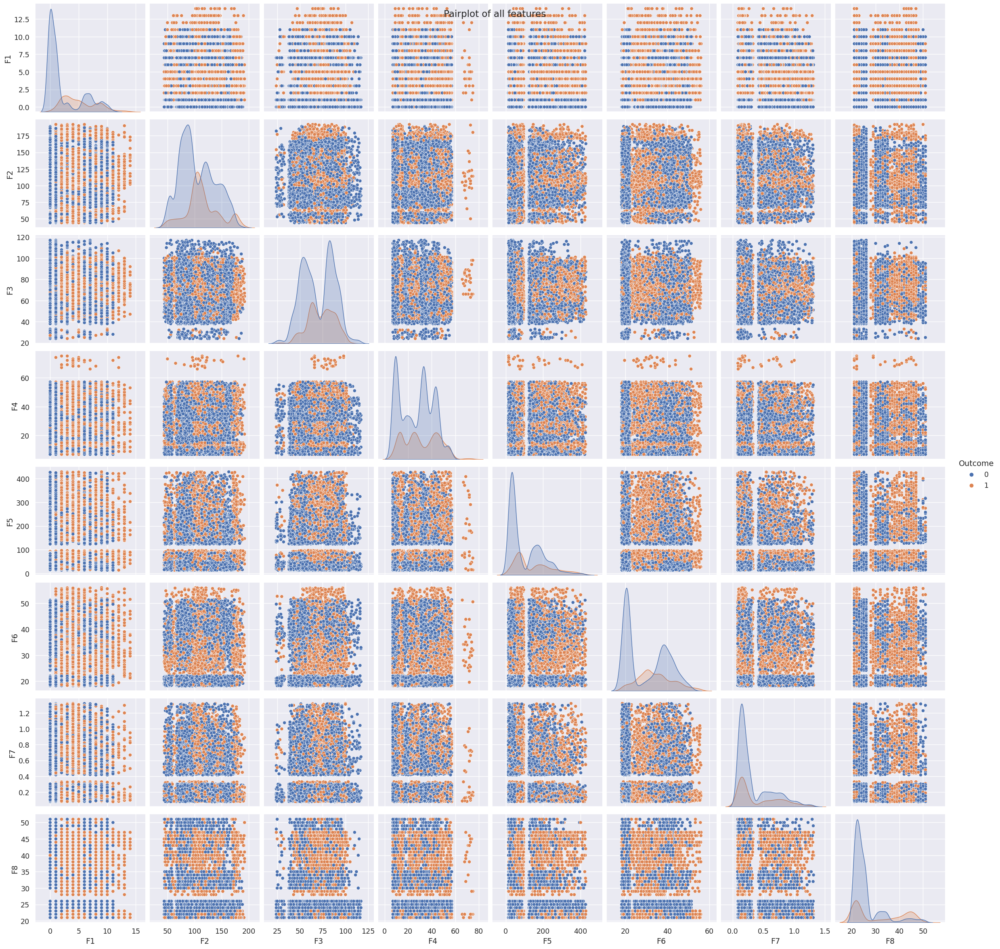

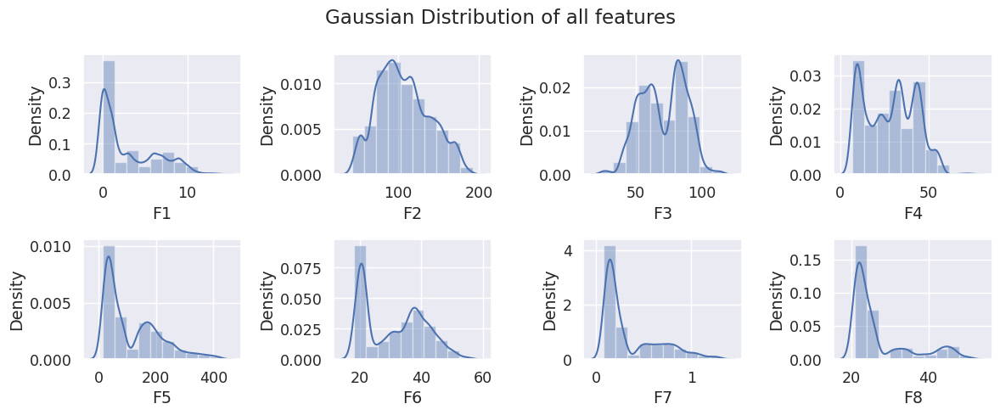

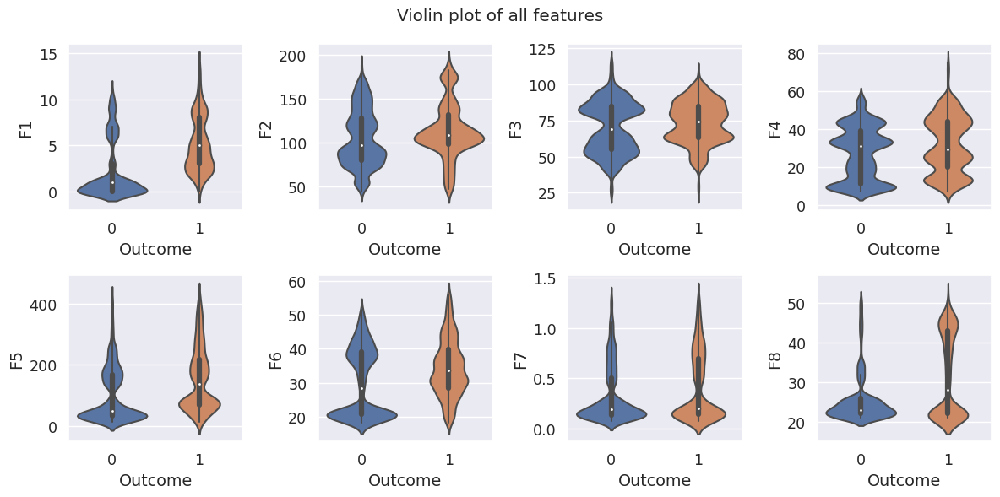

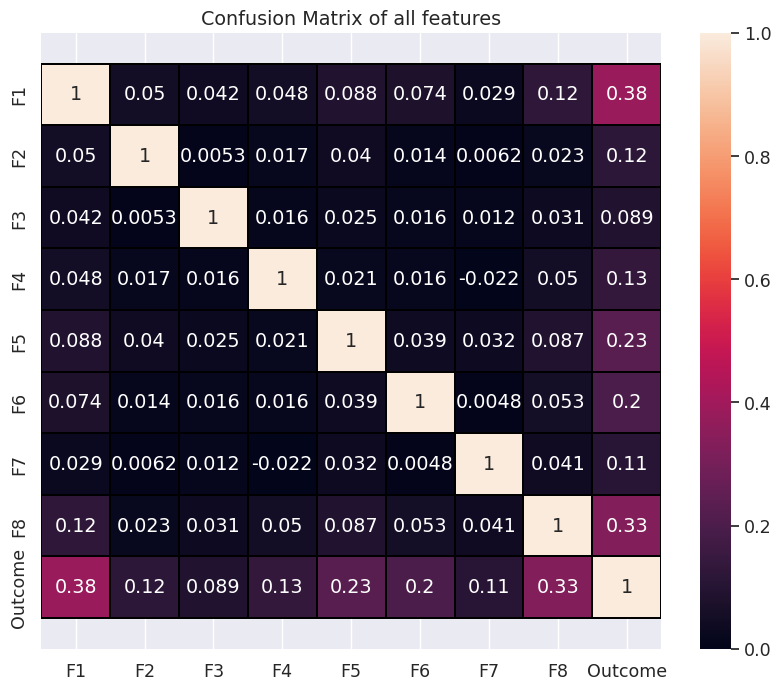

In [ ]:
data_plot (data,
          Pair_plot=True,
          Dist_Plot=True,
          Plot_violinplot=True,
          Plot_confusionMatrix=True,
          box_Gaussian=False)

In [ ]:
def metrics (y_true, y_pred, probas_):

  points=n_dots*'-'
  print(points)

  fpr, tpr, thresholds = roc_curve(y_true, probas_[:, 1])
  tprs.append(interp(mean_fpr, fpr, tpr))
  tprs[-1][0] = 0.0
  roc_auc = auc(fpr, tpr)
  print("Detailed classification report for current fold:")
  print()
  print(classification_report(y_true, y_pred))
  print()
  print("Area Under ROC (AUC): {}".format(roc_auc))
  print()
  print('Confusion Matrix for current fold: ')
  print(confusion_matrix(y_true, y_pred))
  print()
  print("Accuracy for Current Fold: {}".format(accuracy_score(y_true, y_pred)))
  print()
  tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

  return  tn, fp, fn, tp, roc_auc, fpr, tpr


def average_ROC(mean_fpr,tprs,aucs,TP,TN,FP,FN):


  sen = (np.sum(TP))/(np.sum(TP)+np.sum(FN))
  spe = (np.sum(TN))/(np.sum(TN)+np.sum(FP))

  mean_tpr = np.mean(tprs, axis=0)
  mean_tpr[-1] = 1.0
 
  mean_auc = np.mean(aucs)
  std_auc = np.std(aucs)

  ax = plt.axes()
  ax.grid(color='lightgray', linestyle='-', linewidth=.5)
  ax.set_facecolor("white")
  
  ax.spines['bottom'].set_color('#000000')
  ax.spines['top'].set_color('#000000') 
  ax.spines['right'].set_color('#000000')
  ax.spines['left'].set_color('#000000')

  plt.plot(mean_fpr, mean_tpr, color='blue',
          label=r'Avg. ROC (AUC (avg $\pm$ std) = %0.3f $\pm$ %0.3f)' % (mean_auc, std_auc),
          lw=2, alpha=.8)
  
  plt.scatter((1-spe), sen, s=80, c='r', marker='x',)
  plt.scatter(0, sen, s=80, c='r', marker='x',)
  plt.scatter((1-spe),0, s=80, c='r', marker='x',)
  plt.axhline(y=sen, color='r', linestyle='--')
  plt.axvline(x=(1-spe), color='r', linestyle='--')
  plt.text((1-spe), 0.02, "FPR={:0.3f}".format((1-spe)))
  plt.text(0.009, sen+0.05, "TPR={:0.3f}".format(sen))

  std_tpr = np.std(tprs, axis=0)
  tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
  tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
  plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='darkgray', alpha=0.5,
                  label=r'$\pm$ 1 Standard deviation')

  plt.xticks(np.arange(0.0, 1.01, step=0.1))
  plt.yticks(np.arange(0.0, 1.01, step=0.1))
  left=0.0
  right=1.0
  plt.xlim(left, right)
  plt.ylim(left, right)
  plt.xlabel('False Positive Rate (FPR)')
  plt.ylabel('True Positive Rate (TPR)')
  plt.legend(loc="lower right")
  plt.show()

def plot_Current_ROC(fpr,tpr,iterator,roc_auc):

  plt.plot(fpr,
          
          tpr,
          alpha=0.35,
          linewidth=1)

   
def creat_Model (classifier, X_Train, Y_Train, tuned_parameters, verbose):

  clf = GridSearchCV(classifier,
                    tuned_parameters,
                    verbose=verbose,
                    cv=5,
                    scoring='roc_auc',
                    n_jobs=-1)
  clf.fit(X_Train, Y_Train)
  return clf

def average_performance(aucs,Accuracy,TP,TN,FP,FN): 

  print()
  n_dotsav=(n_dots-len('Average'))//2
    
  print('-'*n_dotsav+'Average'+'-'*n_dotsav)
  print("AUC (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(aucs),np.std(aucs)))
  print("Accuracy (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(Accuracy),np.std(Accuracy)))
  cm = [[int(np.mean(TP)), int(np.mean(FP))],[int(np.mean(FN)), int(np.mean(TN))]]
  print ('Avg. CM is '+str(cm))
  cm = [[int(np.sum(TP)), int(np.sum(FP))],[int(np.sum(FN)), int(np.sum(TN))]]
  print ('Total for all folds CM is '+str(cm))
  re_auc=str(round(np.mean(aucs), 3))+'+/-'+str(round(np.std(aucs),3))
  all_clf_res.append(re_auc)

# KNN

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.87      0.97      0.92      1824
           1       0.89      0.63      0.73       689

    accuracy                           0.88      2513
   macro avg       0.88      0.80      0.83      2513
weighted avg       0.88      0.88      0.87      2513


Area Under ROC (AUC): 0.9354359228986835

Confusion Matrix for current fold: 
[[1769   55]
 [ 258  431]]

Accuracy for Current Fold: 0.8754476721050537

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.87      0.97      0.92      1824
           1       0.89      0.63      0.74       689

    accuracy                           0.88      2513
   macro avg       0.88      0.80      0.83      2513
weighted avg       0.88      0.88      0.87  

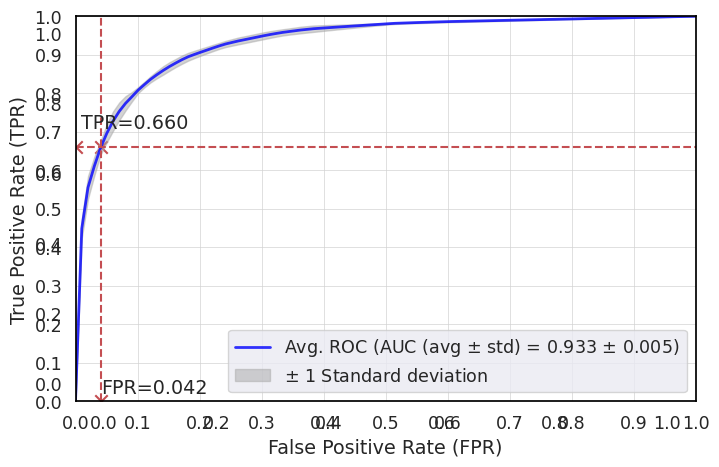


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.933 +/- 0.005
Accuracy (Avg. +/- Std.) is  0.877 +/- 0.005
Avg. CM is [[454, 75], [233, 1748]]
Total for all folds CM is [[2273, 379], [1169, 8741]]


In [ ]:
Accuracy = []                                                               
FP = []                                                                      
TN = []                                                                      
FN = []                                                                      
TP = []                                                                      
tprs = []                                                                   
aucs_kNN = []                                                               
iterator=0
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure(figsize=(8, 5))

for train_index, test_index in kf.split(X_Data,Y_Lavel):                    
    X_Train, X_Test = X_Data[train_index], X_Data[test_index]                
    Y_Train, Y_Test = Y_Lavel[train_index], Y_Lavel[test_index]             
    n_neighbors = [1,3,5,7,9,11,13,15,17,19,21,23,25,27,29,31,33,35,37,39,41,43,45,47,49]
    leaf_size = [5,10,15,20,25,30,35,40,45,50]
    Distance = [1,2]


    tuned_parameters = [ {'n_neighbors': n_neighbors,                        
                        'algorithm' : ['brute'],
                        'p':Distance},

                         {'n_neighbors': n_neighbors, 
                        'algorithm' : ['ball_tree'],
                        'leaf_size' : leaf_size,
                        'p':Distance},

                        {'n_neighbors': n_neighbors, 
                        'algorithm' : ['kd_tree'],
                        'leaf_size' : leaf_size,
                        'p':Distance}]

    clf = creat_Model (classifier = KNeighborsClassifier(),                     
                      X_Train = X_Train,
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters,
                      verbose=0)

    tn, fp, fn, tp, roc_auc, fpr, tpr = metrics (y_true = Y_Test,               
                                                y_pred = clf.predict(X_Test),
                                                probas_ = clf.predict_proba(X_Test))
    tprs.append(interp(mean_fpr, fpr, tpr))                                     
    tprs[-1][0] = 0.0
    aucs_kNN.append(roc_auc)
    plot_Current_ROC (fpr,tpr,iterator,roc_auc)                                 
    iterator += 1
    TN.append(tn)
    FP.append(fp)
    FN.append(fn)
    TP.append(tp)
    Accuracy.append(accuracy_score(Y_Test, clf.predict(X_Test)))
average_ROC(mean_fpr,tprs,aucs_kNN,TP,TN,FP,FN)                                 
average_performance(aucs_kNN,Accuracy,TP,TN,FP,FN)                              

# DECISION TREE

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.91      0.92      0.91      1824
           1       0.78      0.76      0.77       689

    accuracy                           0.88      2513
   macro avg       0.85      0.84      0.84      2513
weighted avg       0.88      0.88      0.88      2513


Area Under ROC (AUC): 0.9429935961092863

Confusion Matrix for current fold: 
[[1674  150]
 [ 162  527]]

Accuracy for Current Fold: 0.8758456028651015

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      1824
           1       0.80      0.79      0.80       689

    accuracy                           0.89      2513
   macro avg       0.86      0.86      0.86      2513
weighted avg       0.89      0.89      0.89  

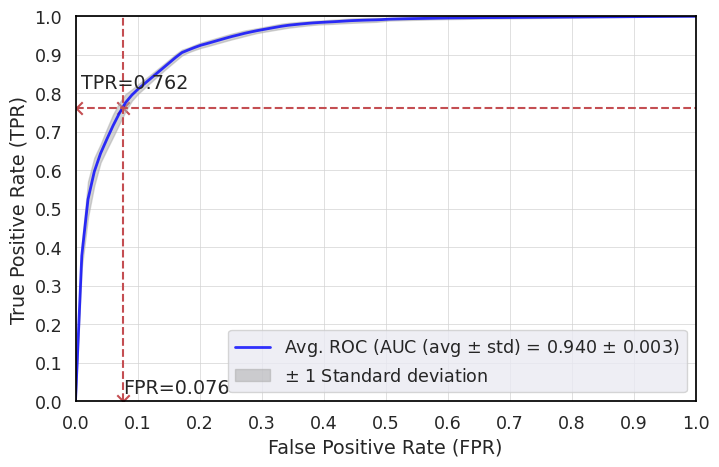


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.940 +/- 0.003
Accuracy (Avg. +/- Std.) is  0.879 +/- 0.006
Avg. CM is [[524, 139], [163, 1685]]
Total for all folds CM is [[2623, 695], [819, 8425]]


In [ ]:
Accuracy = []                                                               
FP = []                                                                     
TN = []                                                                     
FN = []                                                                     
TP = []                                                                      
tprs = []                                                                    
aucs_Tree = []                                                               
iterator=0
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure(figsize=(8, 5))

for train_index, test_index in kf.split(X_Data,Y_Lavel):
    X_Train, X_Test = X_Data[train_index], X_Data[test_index]
    Y_Train, Y_Test = Y_Lavel[train_index], Y_Lavel[test_index]

                                                                           

    tuned_parameters = {'criterion': ['gini','entropy'],
                       'splitter': ['best'],
                       'min_samples_split':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
                       'min_samples_leaf': [1,2,3,4,5] }

    clf = creat_Model (classifier = DecisionTreeClassifier( random_state=random_initializer),
                      X_Train = X_Train,                                    
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters,
                      verbose=0)

    tn, fp, fn, tp, roc_auc, fpr, tpr = metrics (y_true = Y_Test,          
                                                y_pred = clf.predict(X_Test),
                                                probas_ = clf.predict_proba(X_Test))
    tprs.append(interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    aucs_Tree.append(roc_auc)                                               
    iterator += 1
    TN.append(tn)
    FP.append(fp)
    FN.append(fn)
    TP.append(tp)
    Accuracy.append(accuracy_score(Y_Test, clf.predict(X_Test)))
average_ROC(mean_fpr,tprs,aucs_Tree,TP,TN,FP,FN)                            
average_performance(aucs_Tree,Accuracy,TP,TN,FP,FN)

# RANDOM FOREST

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1824
           1       0.91      0.86      0.88       689

    accuracy                           0.94      2513
   macro avg       0.93      0.91      0.92      2513
weighted avg       0.94      0.94      0.94      2513


Area Under ROC (AUC): 0.9814738338043949

Confusion Matrix for current fold: 
[[1762   62]
 [  98  591]]

Accuracy for Current Fold: 0.9363310783923597

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1824
           1       0.92      0.88      0.90       689

    accuracy                           0.94      2513
   macro avg       0.93      0.92      0.93      2513
weighted avg       0.94      0.94      0.94  

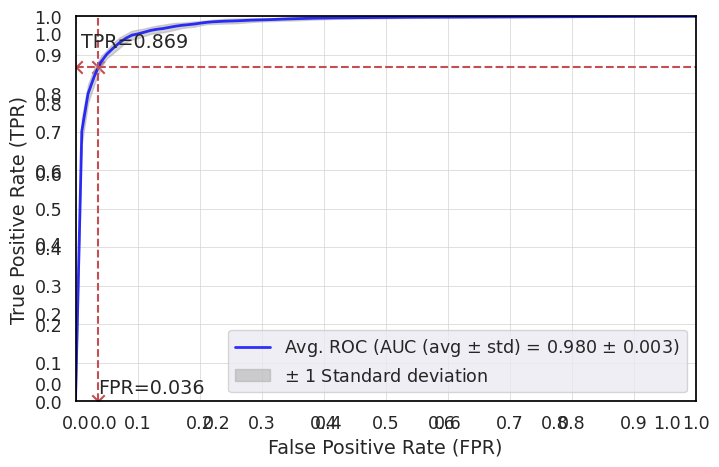


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.980 +/- 0.003
Accuracy (Avg. +/- Std.) is  0.938 +/- 0.004
Avg. CM is [[598, 65], [90, 1758]]
Total for all folds CM is [[2990, 328], [452, 8792]]


In [ ]:
Accuracy = []                                                                 
FP = []                                                                      
TN = []                                                                      
FN = []                                                                      
TP = []                                                                      
tprs = []                                                                    
aucs_Forest = []                                                             # for store the values of auc of Random Forest model
iterator=0
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure(figsize=(8, 5))

for train_index, test_index in kf.split(X_Data,Y_Lavel):                     
#   print("TRAIN:", train_index, "TEST:", test_index)
    X_Train, X_Test = X_Data[train_index], X_Data[test_index]                
    Y_Train, Y_Test = Y_Lavel[train_index], Y_Lavel[test_index]              

    # parameters of Random Forest model
    tuned_parameters = {'criterion': ['gini','entropy']}

    clf = creat_Model (classifier = RandomForestClassifier( random_state=random_initializer),
                      X_Train = X_Train,                                      
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters,
                      verbose=0)

    tn, fp, fn, tp, roc_auc, fpr, tpr = metrics (y_true = Y_Test,              
                                                y_pred = clf.predict(X_Test),
                                                probas_ = clf.predict_proba(X_Test))
    tprs.append(interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    aucs_Forest.append(roc_auc)
    plot_Current_ROC (fpr,tpr,iterator,roc_auc)                               
    iterator += 1
    TN.append(tn)
    FP.append(fp)
    FN.append(fn)
    TP.append(tp)
    Accuracy.append(accuracy_score(Y_Test, clf.predict(X_Test)))
average_ROC(mean_fpr,tprs,aucs_Forest,TP,TN,FP,FN)                            
average_performance(aucs_Forest,Accuracy,TP,TN,FP,FN)                         

# ADA BOOST

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1824
           1       0.94      0.91      0.93       689

    accuracy                           0.96      2513
   macro avg       0.96      0.94      0.95      2513
weighted avg       0.96      0.96      0.96      2513


Area Under ROC (AUC): 0.9903225498434036

Confusion Matrix for current fold: 
[[1787   37]
 [  62  627]]

Accuracy for Current Fold: 0.9606048547552726

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1824
           1       0.92      0.93      0.93       689

    accuracy                           0.96      2513
   macro avg       0.95      0.95      0.95      2513
weighted avg       0.96      0.96      0.96  

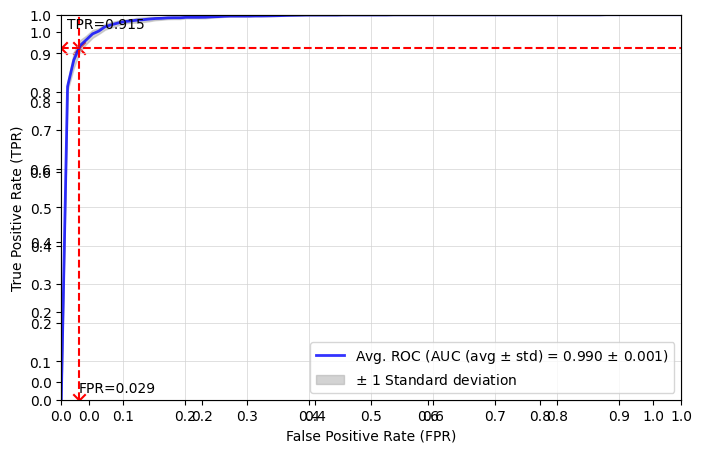


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.990 +/- 0.001
Accuracy (Avg. +/- Std.) is  0.956 +/- 0.005
Avg. CM is [[629, 52], [58, 1771]]
Total for all folds CM is [[3148, 261], [294, 8859]]


In [ ]:
Accuracy = []                                                                
FP = []                                                                     
TN = []                                                                      
FN = []                                                                      
TP = []                                                                      
tprs = []                                                                   
aucs_aBoost = []                                                            
iterator=0

mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure(figsize=(8, 5))


for train_index, test_index in kf.split(X_Data,Y_Lavel):                     
    X_Train, X_Test = X_Data[train_index], X_Data[test_index]                
    Y_Train, Y_Test = Y_Lavel[train_index], Y_Lavel[test_index]              

    tuned_parameters = { 'algorithm': ['SAMME','SAMME.R'],
                       'learning_rate':[0.1,0.5,1.0],
                       'n_estimators': [10,50,100,200]}

    
    clf = creat_Model (classifier = AdaBoostClassifier( random_state=random_initializer),
                      X_Train = X_Train,                                      
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters,
                      verbose=0)
    tn, fp, fn, tp, roc_auc, fpr, tpr = metrics (y_true = Y_Test,             
                                                y_pred = clf.predict(X_Test),
                                                probas_ = clf.predict_proba(X_Test))
    tprs.append(interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    aucs_aBoost.append(roc_auc)
    plot_Current_ROC (fpr,tpr,iterator,roc_auc)                              
    iterator += 1
    TN.append(tn)
    FP.append(fp)
    FN.append(fn)
    TP.append(tp)
    Accuracy.append(accuracy_score(Y_Test, clf.predict(X_Test)))
average_ROC(mean_fpr,tprs,aucs_aBoost,TP,TN,FP,FN)                           
average_performance(aucs_aBoost,Accuracy,TP,TN,FP,FN)                        

# NAIVE BAYES

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1824
           1       0.69      0.54      0.61       689

    accuracy                           0.81      2513
   macro avg       0.76      0.72      0.74      2513
weighted avg       0.80      0.81      0.80      2513


Area Under ROC (AUC): 0.8541738280752681

Confusion Matrix for current fold: 
[[1655  169]
 [ 316  373]]

Accuracy for Current Fold: 0.8070035813768405

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1824
           1       0.65      0.52      0.58       689

    accuracy                           0.79      2513
   macro avg       0.74      0.71      0.72      2513
weighted avg       0.78      0.79      0.78  

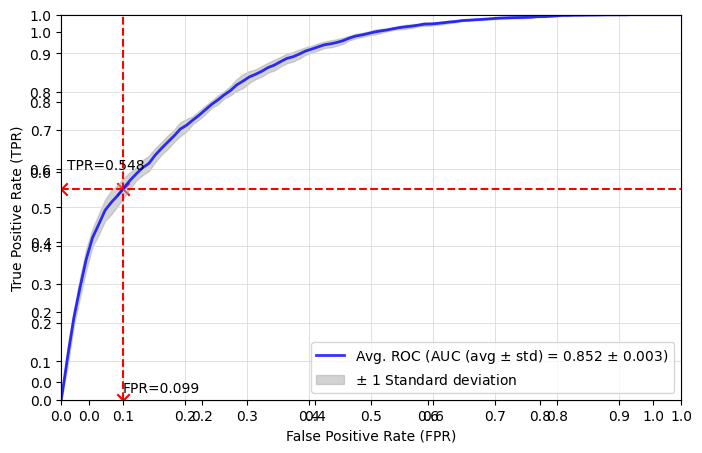


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.852 +/- 0.003
Accuracy (Avg. +/- Std.) is  0.804 +/- 0.008
Avg. CM is [[377, 181], [311, 1643]]
Total for all folds CM is [[1885, 905], [1557, 8215]]


In [ ]:
Accuracy = []                                                                 
FP = []                                                                       
TN = []                                                                      
FN = []                                                                      
TP = []                                                                      
tprs = []                                                                    
aucs_NB = []                                                                 
iterator=0

mean_fpr = np.linspace(0, 1, 100) 
fig = plt.figure(figsize=(8, 5))


for train_index, test_index in kf.split(X_Data,Y_Lavel):                     
#   print("TRAIN:", train_index, "TEST:", test_index)
    X_Train, X_Test = X_Data[train_index], X_Data[test_index]                
    Y_Train, Y_Test = Y_Lavel[train_index], Y_Lavel[test_index]              

    var_smoothing = [1e-01,
                    1e-02,
                    1e-03,
                    1e-04,
                    1e-05,
                    1e-06,
                    1e-07,
                    1e-08,
                    1e-09,
                    1e-10,
                    1e-11,
                    1e-12]

    tuned_parameters = [{'var_smoothing': var_smoothing}]

   
    clf = creat_Model (classifier = GaussianNB(),                             
                      X_Train = X_Train,
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters,
                      verbose=0)
    tn, fp, fn, tp, roc_auc, fpr, tpr = metrics (y_true = Y_Test,             
                                                y_pred = clf.predict(X_Test),
                                                probas_ = clf.predict_proba(X_Test))
    tprs.append(interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    aucs_NB.append(roc_auc)
    plot_Current_ROC (fpr,tpr,iterator,roc_auc)                               
    iterator += 1
    TN.append(tn)
    FP.append(fp)
    FN.append(fn)
    TP.append(tp)
    Accuracy.append(accuracy_score(Y_Test, clf.predict(X_Test)))
average_ROC(mean_fpr,tprs,aucs_NB,TP,TN,FP,FN)                               
average_performance(aucs_NB,Accuracy,TP,TN,FP,FN)                            

# XG BOOST

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1824
           1       0.95      0.91      0.93       689

    accuracy                           0.96      2513
   macro avg       0.96      0.95      0.95      2513
weighted avg       0.96      0.96      0.96      2513


Area Under ROC (AUC): 0.9925425865098159

Confusion Matrix for current fold: 
[[1792   32]
 [  61  628]]

Accuracy for Current Fold: 0.9629924393155591

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1824
           1       0.94      0.92      0.93       689

    accuracy                           0.96      2513
   macro avg       0.95      0.95      0.95      2513
weighted avg       0.96      0.96      0.96  

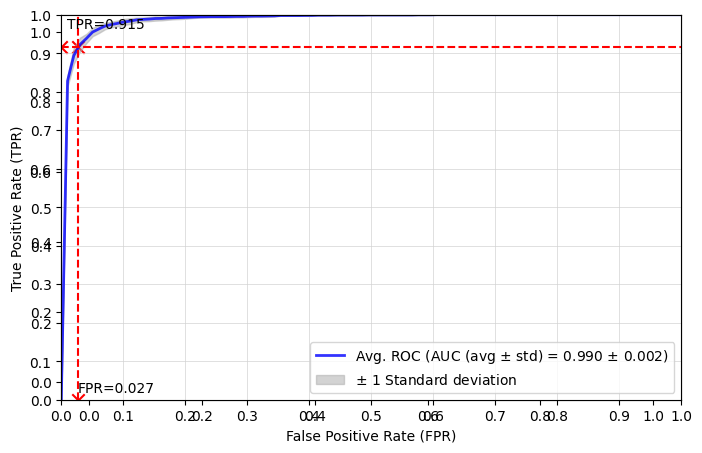


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.990 +/- 0.002
Accuracy (Avg. +/- Std.) is  0.957 +/- 0.006
Avg. CM is [[630, 49], [58, 1774]]
Total for all folds CM is [[3150, 247], [292, 8873]]
Sensitivity (Avg. +/- Std.) is  0.915 +/- 0.012
Specificity (Avg. +/- Std.) is  0.973 +/- 0.006
Precision (Avg. +/- Std.) is  0.927 +/- 0.015
FOR (Avg. +/- Std.) is  0.032 +/- 0.004
DOR (Avg. +/- Std.) is  420.150 +/- 118.970


In [ ]:
Accuracy = []                                                                
FP = []                                                                     
TN = []                                                                      
FN = []                                                                     
TP = []                                                                      
tprs = []                                                                   
aucs_xboost = []                                                                
sn = []                                                                      
sp = []                                                                      
pr = []                                                                     
FOR = []                                                                    
DOR = []                                                                     
iterator=0
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure(figsize=(8, 5))


for train_index, test_index in kf.split(X_Data,Y_Lavel):                     
    X_Train, X_Test = X_Data[train_index], X_Data[test_index]                
    Y_Train, Y_Test = Y_Lavel[train_index], Y_Lavel[test_index]              
    tuned_parameters = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.5, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

    clf = creat_Model (classifier = xgb.XGBClassifier(objective = "binary:logistic", eval_metric = 'error', random_state=random_initializer),
                      X_Train = X_Train,                                       
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters,
                      verbose=0)
    tn, fp, fn, tp, roc_auc, fpr, tpr = metrics (y_true = Y_Test,               
                                                y_pred = clf.predict(X_Test),
                                                probas_ = clf.predict_proba(X_Test))
    tprs.append(interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    aucs_xboost.append(roc_auc)
    plot_Current_ROC(fpr,tpr,iterator,roc_auc)                                 
    iterator += 1
    TN.append(tn)
    FP.append(fp)
    FN.append(fn)
    TP.append(tp)
    Accuracy.append(accuracy_score(Y_Test, clf.predict(X_Test)))
    sn.append(tp/(tp+fn))
    sp.append(tn/(fp+tn))
    pr.append(tp/(tp+fp))
    FOR.append(fn/(tn+fn))
    DOR.append((tp*tn)/(fp*fn))

average_ROC(mean_fpr,tprs,aucs_xboost,TP,TN,FP,FN)                             
average_performance(aucs_xboost,Accuracy,TP,TN,FP,FN)                          
print("Sensitivity (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(sn),np.std(sn)))
print("Specificity (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(sp),np.std(sp)))
print("Precision (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(pr),np.std(pr)))
print("FOR (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(FOR),np.std(FOR)))
print("DOR (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(DOR),np.std(DOR)))

# Ensembling models

In [ ]:
def Ensembler(n_model, X_Train, Y_Train, X_Test, Y_Test, weight):
    tuned_parameters_ab = { 'algorithm': ['SAMME','SAMME.R'],        
                   'learning_rate':[0.1,0.5,1.0],
                   'n_estimators': [10,50,100,200]}

    clf_ab = creat_Model (classifier = AdaBoostClassifier(random_state=random_initializer),
                  X_Train = X_Train,                                              
                  Y_Train = Y_Train,
                  tuned_parameters = tuned_parameters_ab,
                  verbose=0)
    
    

    tuned_parameters_xb = {                                         
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.5, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

        
    clf_xb = creat_Model (classifier = xgb.XGBClassifier(objective = "binary:logistic", eval_metric = 'error',random_state=random_initializer),
                      X_Train = X_Train,                             
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters_xb,
                      verbose=0)
    tuned_parameters_dt = {'criterion': ['gini','entropy'],          
                       'splitter': ['best'],
                       'min_samples_split':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
                       'min_samples_leaf': [1,2,3,4,5] }

    clf_dt = creat_Model (classifier = DecisionTreeClassifier(random_state=random_initializer),
                      X_Train = X_Train,                            
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters_dt,
                      verbose=0)
    n_neighbors = [1,3,5,7,9,11,13,15,17,19,21,23,25,27,29,31,33,35,37,39,41,43,45,47,49]
    leaf_size = [5,10,15,20,25,30,35,40,45,50]
    Distance = [1,2]
                                                                      
    tuned_parameters_knn = [ {'n_neighbors': n_neighbors, 
                        'algorithm' : ['brute'],
                        'p':Distance},
                         
                         {'n_neighbors': n_neighbors, 
                        'algorithm' : ['ball_tree'],
                        'leaf_size' : leaf_size,
                        'p':Distance},
                          
                        {'n_neighbors': n_neighbors, 
                        'algorithm' : ['kd_tree'],
                        'leaf_size' : leaf_size,
                        'p':Distance}]

    clf_knn = creat_Model (classifier = KNeighborsClassifier(),               
                      X_Train = X_Train,
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters_knn,
                      verbose=0)
    tuned_parameters_rf = {'criterion': ['gini','entropy']}          # define parameters of RandomForestClassifier

    clf_rf = creat_Model (classifier = RandomForestClassifier(random_state=random_initializer),
                      X_Train = X_Train,                             #create model with RandomForest  classifier with utility function 
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters_rf,
                      verbose=0)
    var_smoothing = [1e-01,
                    1e-02,
                    1e-03,
                    1e-04,
                    1e-05,
                    1e-06,
                    1e-07,
                    1e-08,
                    1e-09,
                    1e-10,
                    1e-11,
                    1e-12]

    tuned_parameters_nb = [{'var_smoothing': var_smoothing}]         # define parameters of Naive Bais

    clf_nb = creat_Model (classifier = GaussianNB(),                 #create model with Naive Bais  classifier with utility function 
                      X_Train = X_Train,
                      Y_Train = Y_Train,
                      tuned_parameters = tuned_parameters_nb,
                      verbose=0)
    
    
    if weight == 'None':                                             
        if n_model == 2:                                              
            model = VotingClassifier([('ab', clf_ab), 
                                      ('xb', clf_xb)], 
                                     voting='soft')
            model.fit(X_Train,Y_Train)
            return model 
        if n_model == 3:                                                                          
            model = VotingClassifier([('knn', clf_knn), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt)], 
                                     voting='soft')
            model.fit(X_Train,Y_Train)
            return model
        if n_model == 4:                                               #Using 4 best model we create ensembled model with soft voting    
            model = VotingClassifier([('ab', clf_ab), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt),
                                      ('rf',clf_rf)], 
                                     voting='soft')
            model.fit(X_Train,Y_Train)
            return model
        if n_model == 5:                                               #Using 5 best model we create ensembled model with soft voting    
            model = VotingClassifier([('knn', clf_knn), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt),
                                      ('rf',clf_rf),
                                      ('nb',clf_nb)], 
                                     voting='soft')
            model.fit(X_Train,Y_Train)
            return model
        if n_model == 6:                                               #Using 6 best model we create ensembled model with soft voting    
            model = VotingClassifier([('knn', clf_knn), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt),
                                      ('rf',clf_rf),
                                      ('nb',clf_nb),
                                      ('ab',clf_ab)], 
                                     voting='soft')
            model.fit(X_Train,Y_Train)
            return model
        
    if weight == 'accuracy':
        if n_model == 2:                                               #Using 6 best model we create ensembled model with soft voting   
            model = VotingClassifier([('ab', clf_ab), 
                                      ('xb', clf_xb)], 
                                     voting='soft',
                                     weights=[accuracy_score(Y_Test, clf_ab.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_xb.predict(X_Test))])
            model.fit(X_Train,Y_Train)
            return model 
        if n_model == 3:                                               #Using 6 best model we create ensembled model with soft voting    
            model = VotingClassifier([('knn', clf_knn), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt)], 
                                     voting='soft',
                                     weights=[accuracy_score(Y_Test, clf_knn.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_xb.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_dt.predict(X_Test))])
            model.fit(X_Train,Y_Train)
            return model
        if n_model == 4:                                               #Using 6 best model we create ensembled model with soft voting    
            model = VotingClassifier([('ab', clf_ab), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt),
                                      ('rf',clf_rf)], 
                                     voting='soft',
                                     weights=[accuracy_score(Y_Test, clf_ab.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_xb.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_dt.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_rf.predict(X_Test))])
            model.fit(X_Train,Y_Train)
            return model
        if n_model == 5:                                               #Using 6 best model we create ensembled model with soft voting    
            model = VotingClassifier([('knn', clf_knn), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt),
                                      ('rf',clf_rf),
                                      ('nb',clf_nb)], 
                                     voting='soft',
                                     weights=[accuracy_score(Y_Test, clf_knn.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_xb.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_dt.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_rf.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_nb.predict(X_Test))])
            model.fit(X_Train,Y_Train)
            return model
        if n_model == 6:                                               #Using 6 best model we create ensembled model with soft voting    
            model = VotingClassifier([('knn', clf_knn), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt),
                                      ('rf',clf_rf),
                                      ('nb',clf_nb),
                                      ('ab',clf_ab)], 
                                     voting='soft',
                                     weights=[accuracy_score(Y_Test, clf_knn.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_xb.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_dt.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_rf.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_nb.predict(X_Test)),
                                              accuracy_score(Y_Test, clf_ab.predict(X_Test))])
            model.fit(X_Train,Y_Train)
            return model
         
    
    if weight == 'auc':
        if n_model == 2:                                               #Using 2 best model we create ensembled model with soft voting    
            model = VotingClassifier([('ab', clf_ab), 
                                      ('xb', clf_xb)], 
                                     voting='soft',
                                     weights=[roc_auc_score(Y_Test, clf_ab.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_xb.predict(X_Test))])
            model.fit(X_Train,Y_Train)
            return model 
        if n_model == 3:                                               #Using 3 best model we create ensembled model with soft voting    
            model = VotingClassifier([('knn', clf_knn), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt)], 
                                     voting='soft',
                                     weights=[roc_auc_score(Y_Test, clf_knn.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_xb.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_dt.predict(X_Test))])
            model.fit(X_Train,Y_Train)
            return model
        if n_model == 4:                                               #Using 4 best model we create ensembled model with soft voting    
            model = VotingClassifier([('ab', clf_ab), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt),
                                      ('rf',clf_rf)], 
                                     voting='soft',
                                     weights=[roc_auc_score(Y_Test, clf_ab.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_xb.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_dt.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_rf.predict(X_Test))])
            model.fit(X_Train,Y_Train)
            return model
        if n_model == 5:                                               #Using 5 best model we create ensembled model with soft voting    
            model = VotingClassifier([('knn', clf_knn), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt),
                                      ('rf',clf_rf),
                                      ('nb',clf_nb)], 
                                     voting='soft',
                                     weights=[roc_auc_score(Y_Test, clf_knn.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_xb.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_dt.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_rf.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_nb.predict(X_Test))])
            model.fit(X_Train,Y_Train)
            return model
        if n_model == 6:                                               #Using 6 best model we create ensembled model with soft voting    
            model = VotingClassifier([('knn', clf_knn), 
                                      ('xb', clf_xb),
                                      ('dt',clf_dt),
                                      ('rf',clf_rf),
                                      ('nb',clf_nb),
                                      ('ab',clf_ab)], 
                                     voting='soft',
                                     weights=[roc_auc_score(Y_Test, clf_knn.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_xb.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_dt.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_rf.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_nb.predict(X_Test)),
                                              roc_auc_score(Y_Test, clf_ab.predict(X_Test))])
            model.fit(X_Train,Y_Train)
            return model




model running with ensembling  ---  2  models..........
--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1824
           1       0.95      0.91      0.93       689

    accuracy                           0.96      2513
   macro avg       0.96      0.95      0.95      2513
weighted avg       0.96      0.96      0.96      2513


Area Under ROC (AUC): 0.9925871463855575

Confusion Matrix for current fold: 
[[1792   32]
 [  61  628]]

Accuracy for Current Fold: 0.9629924393155591

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1824
           1       0.94      0.92      0.93       689

    accuracy                           0.96      2513
   macro avg       0.95      0.95      0.95

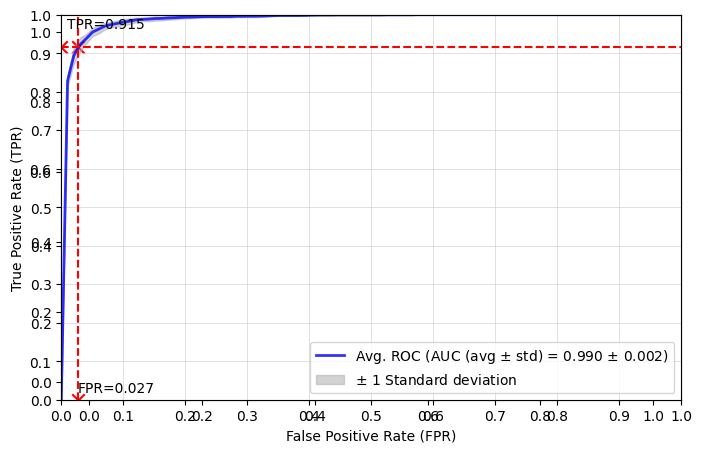


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.990 +/- 0.002
Accuracy (Avg. +/- Std.) is  0.957 +/- 0.006
Avg. CM is [[630, 49], [58, 1774]]
Total for all folds CM is [[3151, 247], [291, 8873]]
Sensitivity (Avg. +/- Std.) is  0.915 +/- 0.012
Specificity (Avg. +/- Std.) is  0.973 +/- 0.006
Precision (Avg. +/- Std.) is  0.928 +/- 0.015
FOR (Avg. +/- Std.) is  0.032 +/- 0.004
DOR (Avg. +/- Std.) is  422.271 +/- 120.621
model running with ensembling  ---  3  models..........
--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      1824
           1       0.95      0.82      0.88       689

    accuracy                           0.94      2513
   macro avg       0.94      0.90      0.92      2513
weighted avg       0.94      0.94      0.94      2513


Area Under ROC (AUC): 0.9847605224963715

Confusion Matrix for cu

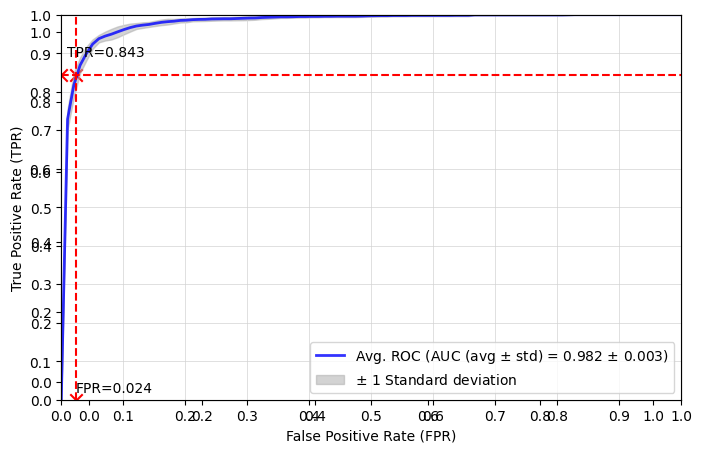


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.982 +/- 0.003
Accuracy (Avg. +/- Std.) is  0.940 +/- 0.005
Avg. CM is [[580, 43], [108, 1781]]
Total for all folds CM is [[2900, 215], [542, 8905]]
Sensitivity (Avg. +/- Std.) is  0.843 +/- 0.015
Specificity (Avg. +/- Std.) is  0.976 +/- 0.005
Precision (Avg. +/- Std.) is  0.931 +/- 0.013
FOR (Avg. +/- Std.) is  0.057 +/- 0.005
DOR (Avg. +/- Std.) is  233.340 +/- 48.000
model running with ensembling  ---  4  models..........
--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1824
           1       0.93      0.87      0.90       689

    accuracy                           0.95      2513
   macro avg       0.94      0.92      0.93      2513
weighted avg       0.95      0.95      0.95      2513


Area Under ROC (AUC): 0.9856429671784687

Confusion Matrix for cu

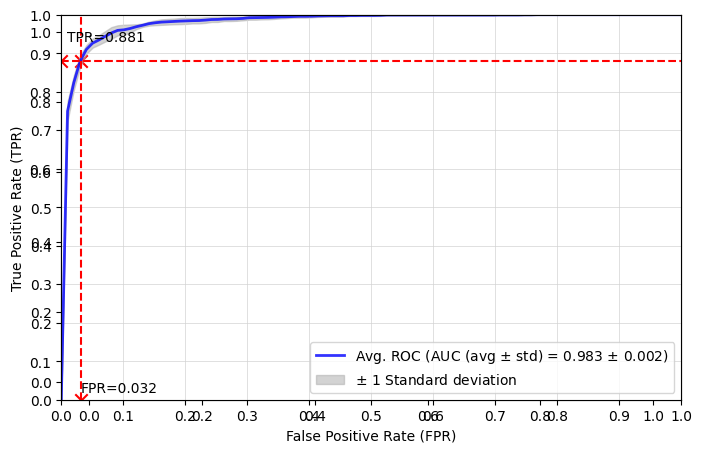


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.983 +/- 0.002
Accuracy (Avg. +/- Std.) is  0.944 +/- 0.002
Avg. CM is [[606, 57], [82, 1766]]
Total for all folds CM is [[3032, 288], [410, 8832]]
Sensitivity (Avg. +/- Std.) is  0.881 +/- 0.008
Specificity (Avg. +/- Std.) is  0.968 +/- 0.004
Precision (Avg. +/- Std.) is  0.913 +/- 0.010
FOR (Avg. +/- Std.) is  0.044 +/- 0.003
DOR (Avg. +/- Std.) is  230.579 +/- 25.093
model running with ensembling  ---  5  models..........
--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      1824
           1       0.94      0.83      0.88       689

    accuracy                           0.94      2513
   macro avg       0.94      0.91      0.92      2513
weighted avg       0.94      0.94      0.94      2513


Area Under ROC (AUC): 0.981964390293586

Confusion Matrix for curr

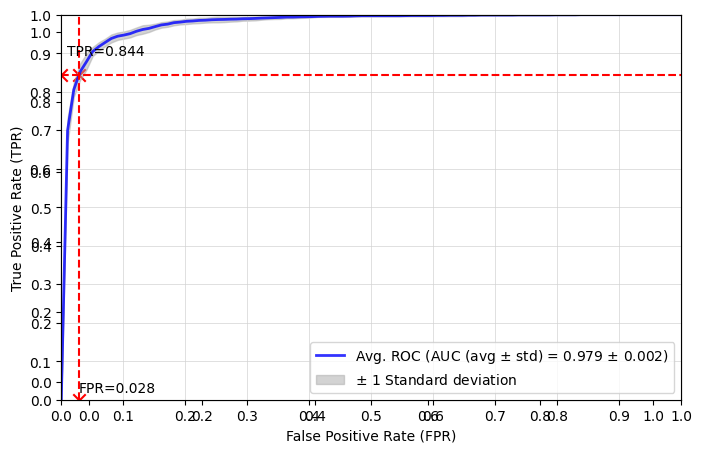


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.979 +/- 0.002
Accuracy (Avg. +/- Std.) is  0.937 +/- 0.004
Avg. CM is [[580, 51], [107, 1772]]
Total for all folds CM is [[2904, 258], [538, 8862]]
Sensitivity (Avg. +/- Std.) is  0.844 +/- 0.008
Specificity (Avg. +/- Std.) is  0.972 +/- 0.005
Precision (Avg. +/- Std.) is  0.919 +/- 0.014
FOR (Avg. +/- Std.) is  0.057 +/- 0.003
DOR (Avg. +/- Std.) is  193.256 +/- 38.809
model running with ensembling  ---  6  models..........
--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      1824
           1       0.94      0.83      0.88       689

    accuracy                           0.94      2513
   macro avg       0.94      0.91      0.92      2513
weighted avg       0.94      0.94      0.94      2513


Area Under ROC (AUC): 0.9820869299518753

Confusion Matrix for cu

In [ ]:
file = open('output.txt','w') 
file.write('\n') 

for i in range(2,7):
    Accuracy = []                                                                 
    FP = []                                                                      
    TN = []                                                                      
    FN = []                                                                     
    TP = []                                                                      
    tprs = []                                                                    
    aucs_ens = []                                                               
    sn = []                                                                       
    sp = []                                                                      
    pr = []                                                                     
    FOR = []                                                                     
    DOR = []                                                                    
    iterator=0
    mean_fpr = np.linspace(0, 1, 100)
    fig = plt.figure(figsize=(8, 5))

    print('model running with ensembling  ---  '+str(i )+'  models..........')

    for train_index, test_index in kf.split(X_Data,Y_Lavel):                    
        X_Train, X_Test = X_Data[train_index], X_Data[test_index]               
        Y_Train, Y_Test = Y_Lavel[train_index], Y_Lavel[test_index]             
        clf = Ensembler( i, X_Train, Y_Train, X_Test, Y_Test, 'None')           

        tn, fp, fn, tp, roc_auc, fpr, tpr = metrics (y_true = Y_Test,   
                                                    y_pred = clf.predict(X_Test),
                                                    probas_ = clf.predict_proba(X_Test))
        tprs.append(interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        aucs_ens.append(roc_auc)
        plot_Current_ROC (fpr,tpr,iterator,roc_auc)                            
        iterator += 1
        TN.append(tn)
        FP.append(fp)
        FN.append(fn)
        TP.append(tp)
        Accuracy.append(accuracy_score(Y_Test, clf.predict(X_Test)))
        sn.append(tp/(tp+fn))
        sp.append(tn/(fp+tn))
        pr.append(tp/(tp+fp))
        FOR.append(fn/(tn+fn))
        DOR.append((tp*tn)/(fp*fn))
    
    average_ROC(mean_fpr,tprs,aucs_ens,TP,TN,FP,FN)                             
    average_performance(aucs_ens,Accuracy,TP,TN,FP,FN)  
    file.write(str(i)+'---------------'+all_clf_res[i-2])
    file.write('\n') 
    file.write('\n') 
    print("Sensitivity (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(sn),np.std(sn)))
    print("Specificity (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(sp),np.std(sp)))
    print("Precision (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(pr),np.std(pr)))
    print("FOR (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(FOR),np.std(FOR)))
    print("DOR (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(DOR),np.std(DOR)))


file.close()

model running with ensembling  ---  6  models..........
--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      1824
           1       0.94      0.83      0.88       689

    accuracy                           0.94      2513
   macro avg       0.94      0.91      0.92      2513
weighted avg       0.94      0.94      0.94      2513


Area Under ROC (AUC): 0.9820869299518753

Confusion Matrix for current fold: 
[[1787   37]
 [ 114  575]]

Accuracy for Current Fold: 0.9399124552327895

--------------------------------------------------
Detailed classification report for current fold:

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      1824
           1       0.93      0.85      0.89       689

    accuracy                           0.94      2513
   macro avg       0.94      0.91      0.92

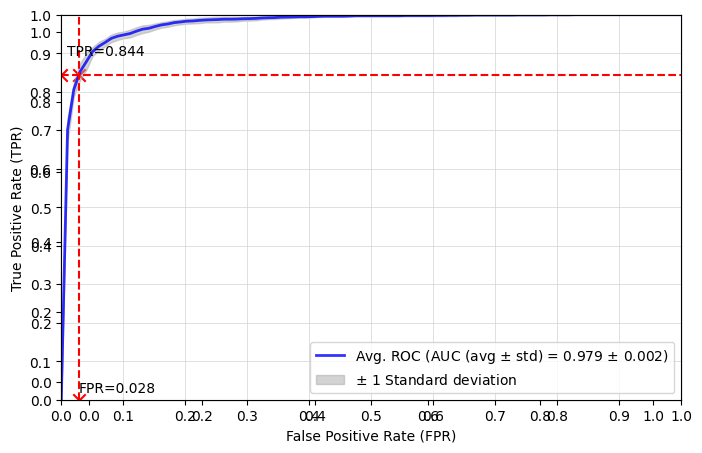


---------------------Average---------------------
AUC (Avg. +/- Std.) is  0.979 +/- 0.002
Accuracy (Avg. +/- Std.) is  0.937 +/- 0.004
Avg. CM is [[581, 51], [107, 1773]]
Total for all folds CM is [[2905, 255], [537, 8865]]
Sensitivity (Avg. +/- Std.) is  0.844 +/- 0.008
Specificity (Avg. +/- Std.) is  0.972 +/- 0.005
Precision (Avg. +/- Std.) is  0.920 +/- 0.014
FOR (Avg. +/- Std.) is  0.057 +/- 0.003
DOR (Avg. +/- Std.) is  195.915 +/- 38.829


In [ ]:
file = open('output.txt','w') 
file.write('\n') 

Accuracy = []                                                                 
FP = []                                                                      
TN = []                                                                      
FN = []                                                                     
TP = []                                                                      
tprs = []                                                                    
aucs_ens = []                                                               
sn = []                                                                       
sp = []                                                                      
pr = []                                                                     
FOR = []                                                                     
DOR = []                                                                    
iterator=0
mean_fpr = np.linspace(0, 1, 100)
fig = plt.figure(figsize=(8, 5))

print('model running with ensembling  ---  '+str(6)+'  models..........')

for train_index, test_index in kf.split(X_Data,Y_Lavel):                    
  X_Train, X_Test = X_Data[train_index], X_Data[test_index]               
  Y_Train, Y_Test = Y_Lavel[train_index], Y_Lavel[test_index]             
  clf = Ensembler( 6, X_Train, Y_Train, X_Test, Y_Test, 'None')           

  tn, fp, fn, tp, roc_auc, fpr, tpr = metrics (y_true = Y_Test,   
                                                    y_pred = clf.predict(X_Test),
                                                    probas_ = clf.predict_proba(X_Test))
  tprs.append(interp(mean_fpr, fpr, tpr))
  tprs[-1][0] = 0.0
  aucs_ens.append(roc_auc)
  plot_Current_ROC (fpr,tpr,iterator,roc_auc)                            
  iterator += 1
  TN.append(tn)
  FP.append(fp)
  FN.append(fn)
  TP.append(tp)
  Accuracy.append(accuracy_score(Y_Test, clf.predict(X_Test)))
  sn.append(tp/(tp+fn))
  sp.append(tn/(fp+tn))
  pr.append(tp/(tp+fp))
  FOR.append(fn/(tn+fn))
  DOR.append((tp*tn)/(fp*fn))
    
average_ROC(mean_fpr,tprs,aucs_ens,TP,TN,FP,FN)                             
average_performance(aucs_ens,Accuracy,TP,TN,FP,FN)  

print("Sensitivity (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(sn),np.std(sn)))
print("Specificity (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(sp),np.std(sp)))
print("Precision (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(pr),np.std(pr)))
print("FOR (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(FOR),np.std(FOR)))
print("DOR (Avg. +/- Std.) is  %0.3f +/- %0.3f" %(np.mean(DOR),np.std(DOR)))


file.close()